---
# DANIAL RAMZAN #24626392
### STAT301-3 PLANNING STAGE (INDIVIDUAL)
### [Diabetes Dataset](https://www.kaggle.com/datasets/whenamancodes/predict-diabities?resource=download)

---

# Group Project Assignment

While this is a group project, it's important to note that this assignment is intended to be completed individually. Every student needs to write and submit their own assignment. Our aim is to ensure that all students in the group are well-prepared and able to contribute effectively to the final report.

## Submission Instructions

You must submit two files in Canvas:
1. **The source Jupyter Notebook (.ipynb file)**
2. **The rendered final document (.html file)**

---

# Data Description

Provide a full description of the dataset chosen. Note that the selected dataset will probably contain more variables than you need. In fact, exploring how the different variables in the dataset affect your model may be a crucial part of the project. Regardless of which variables you plan to use, provide a full descriptive summary of the dataset, including information such as:

- Number of observations
- Number of variables
- Name and type of variables

You may want to use a table or bullet points to describe the variables in the dataset.

Include a brief description of the dataset indicating how the data has been collected or where it comes from.

## Question

Clearly state the question you will try to answer using the selected dataset. Your question should involve one random variable of interest (the response) and one or more explanatory variables. Describe clearly how the data will help you address the question of interest. Explain whether your question is focused on prediction, inference, or both.

It is fine to have the same question as other group members. However, you don’t need to agree on a unique common question for the group project. In fact, usually many questions can be answered with the same dataset. Regardless of how many questions are proposed within each group, each team member must state and justify at least one question of interest.

## Exploratory Data Analysis and Visualization

In this assignment, you will:
- Demonstrate that the dataset can be loaded into R.
- Clean and wrangle your data into a tidy format.
- Propose a visualization that you consider relevant to address your question or to explore the data.
  - Propose a high-quality plot or set of plots of the same kind (e.g., histograms of different variables).
  - Explain why you consider this plot relevant to address your question or to explore the data.

**Note:** This visualization does not have to illustrate the results of a methodology. Instead, you are exploring which variables are relevant, potential problems that you anticipate encountering, groups in the observations, etc.

## Methods and Plan

Propose one method to address your question of interest using the selected dataset and explain why it was chosen. You do not need to run the model and present results at this stage. Just a high-level thinking of what model you are planning to use. 

In your explanation, respond to the following questions:
- Why is this method appropriate?
- Which assumptions are required, if any, to apply the method selected?
- What are the potential limitations or weaknesses of the method selected?

---

Please ensure your notebook is well-organized, and the code is well-documented. Good luck!

---



#### Lets import the necessary libraries!

In [5]:
library(tidyverse)
library(repr)
library(infer)
library(cowplot)
library(broom)
library(GGally)
library(AER)
library(leaps)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: 'cowplot'


The following object is masked from 'package:lubridate':

    stamp


Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2

Loading required package: car

Loading required package: carData


Attaching package: 'car'


The following object is masked from 'package:dplyr':

    recode


The following object is masked from 'package:purrr':

    some


Loading required package: lmtest

Loading required package: zoo


A

---
# \<\<Data Description\>\>

In [6]:
# Load the dataset
diabetes_data <- read.csv("diabetes.csv")
head(diabetes_data)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<int>
1,6,148,72,35,0,33.6,0.627,50,1
2,1,85,66,29,0,26.6,0.351,31,0
3,8,183,64,0,0,23.3,0.672,32,1
4,1,89,66,23,94,28.1,0.167,21,0
5,0,137,40,35,168,43.1,2.288,33,1
6,5,116,74,0,0,25.6,0.201,30,0


#### From above table and the Kaggle source (and another sister dataset which seems to be sourced from the same location: https://www.kaggle.com/datasets/uciml/pima-indians-diabetes-database/data), we can see that we have one independent outcome variable and 8 predictor variables.
#### They are as follows:


| Variable | Description 
| --- | --- 
| **Pregnancies** | Number of pregnancies.
| **Glucose** | Plasma glucose concentration in mg/dL.
| **BloodPressure** | Diastolic blood pressure in mm Hg.
| **SkinThickness** | Triceps skin fold thickness in mm.
| **Insulin** | 2-Hour serum insulin in µU/mL. 
| **BMI** | Body mass index in kg/m².
| **DiabetesPedigreeFunction** | Diabetes pedigree function (a function which scores likelihood of diabetes based on family history).
| **Age** | Age in years.
| **Outcome** | Class variable (0 or 1) where 1 indicates diabetes and 0 indicates no diabetes.

#### The dataset repo on Kaggle provides us some further information about the origins of the data collected:

> This dataset is originally from the National Institute of Diabetes and Digestive and Kidney Diseases. The objective of the dataset is to diagnostically predict whether a patient has diabetes, based on certain diagnostic measurements included in the dataset. Several constraints were placed on the selection of these instances from a larger database. In particular, all patients here are females at least 21 years old of Pima Indian heritage. 

#### The number of observations in the dataset can be acquired by running the following command:


In [12]:
nrow(diabetes_data)

[1] 768

#### Thus, we can see the dataset has 768 recorded observations.

---

# \<\<EDA and Visualization\>\>
###### *I have decided to do my EDA/Visualization first so I can inform my question.

As we can see from performing head(diabetes_data) above, the data is already in a tidy format. Now, lets move on to visualization.

#### To be able to identify appropriate predictors for our (linear?) model, we should first identify any cases of multicollinearity.

In [13]:
# Make a ggpairs plot to identify possible colinearity
diabetes_pair_plots <-
  diabetes_data |>
  select(- Outcome) |>
  ggpairs(progress = FALSE) +
  theme(text = element_text(size = 15))

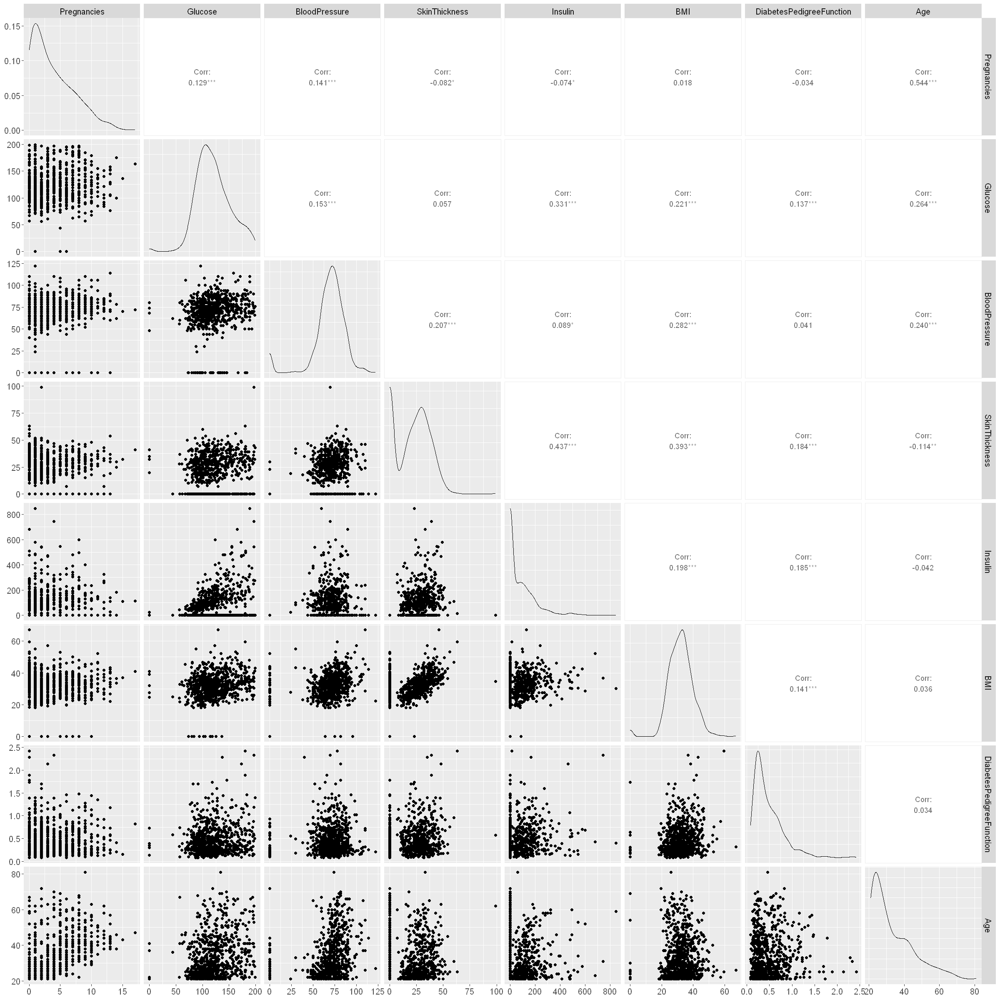

In [14]:
options(repr.plot.width = 20, repr.plot.height = 20)
diabetes_pair_plots

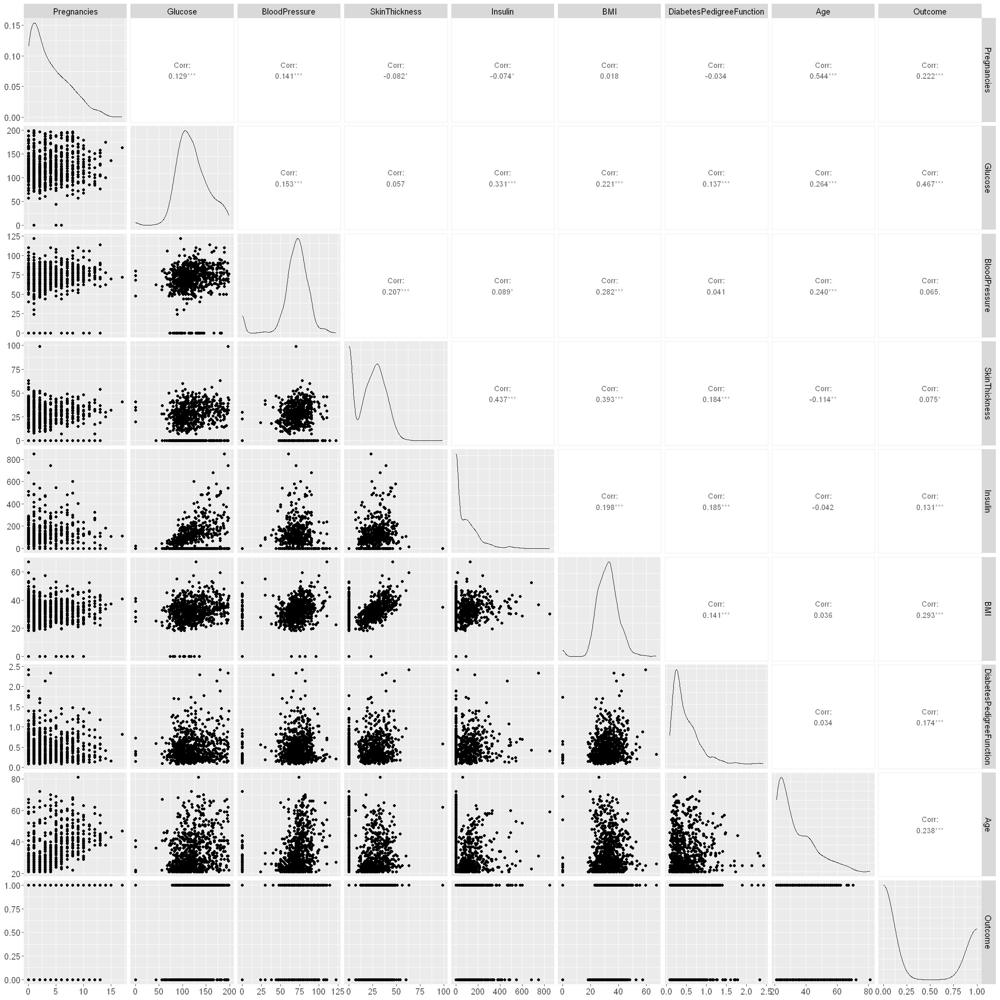

In [15]:
# View the data without outcome removed to check for any obvious predictors.
(diabetes_data |>
  ggpairs(progress = FALSE) +
  theme(text = element_text(size = 15)))

#### From the above graphs, we can see that pregnancy and age have correlation, but that is to be expected, as both the chances and amounts of diabetes and pregnancies respectively increase with age, and with some cursory research we can identify that gestational diabetes exists, therefore it is not safe to remove any of these variables at this point.

#### The next most correlated variables are Skin Thickness and BMI. While these both are moderately correlated, lets hold off on excluding one of them before first having a look at the linear model results.

In [11]:
# Make the linear model with all variables
diabetes_lm <- lm(Outcome ~.,data = diabetes_data)

In [12]:
# Use broom::tidy to output the results in a clean way
diabetes_results <- diabetes_lm |>
                    tidy(conf.int = TRUE, conf.level = 0.90) |>
                    mutate_if(is.numeric, round, 2)

diabetes_results

term,estimate,std.error,statistic,p.value,conf.low,conf.high
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),-0.85,0.09,-9.99,0.00,-0.99,-0.71
Pregnancies,0.02,0.01,4.01,0.00,0.01,0.03
Glucose,0.01,0.00,11.49,0.00,0.01,0.01
BloodPressure,0.00,0.00,-2.87,0.00,0.00,0.00
SkinThickness,0.00,0.00,0.14,0.89,0.00,0.00
Insulin,0.00,0.00,-1.21,0.23,0.00,0.00
BMI,0.01,0.00,6.34,0.00,0.01,0.02
DiabetesPedigreeFunction,0.15,0.05,3.27,0.00,0.07,0.22
Age,0.00,0.00,1.69,0.09,0.00,0.01


#### It looks like SkinThickness has to go due to its very high p value, especially since its correlated with BMI from before

#### How do we improve our adjusted R^2 values, using logistic regression, and what predictors (out of 	Pregnancies, Glucose, BloodPressure, SkinThickness, Insulin, BMI, DiabetesPedigreeFunction, Age) to include in this model? Choosing the superior model will be the focus of later parts of my project. We will do this by using the 
> glm() 

#### function similar to how we have used the 

> lm()

#### function beforehand.

By applying logistic regression to this dataset, we can predict the probability of an individual having diabetes based on these health metrics. Furthermore, we can identify which variables are the most significant predictors and how they influence the likelihood of developing diabetes.

### Focus:

**Prediction:** Logistic regression will allow us to predict the likelihood of diabetes for new observations based on the explanatory variables.

**Inference:** By examining the coefficients of the model, we can infer the strength and direction of the relationship between each explanatory variable and the outcome.

#### This approach will enable us to both predict diabetes and understand the contributing factors, providing valuable insights for healthcare professionals and individuals managing diabetes risk while leverage an appropriate model for the job.

---

In [17]:
# Lets try to fit the linear model with interaction terms
# After this, we sort them by p values in ascending order.
diabetes_lm_interactive <- lm(Outcome ~ Pregnancies * Glucose * BloodPressure * SkinThickness * Insulin * BMI * DiabetesPedigreeFunction * Age, data = diabetes_data)
diabetes_lm_interactive_results <- diabetes_lm_interactive |> tidy(conf.int = TRUE, conf.level = 0.90) |>
                                                            mutate_if(is.numeric, round, 2) |> filter(p.value <= 0.05) |> arrange(10000 - abs(statistic)) 

In [18]:
diabetes_lm_interactive_results

term,estimate,std.error,statistic,p.value,conf.low,conf.high
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Pregnancies:Glucose:DiabetesPedigreeFunction:Age,-0.02,0.00,-3.44,0.00,-0.02,-0.01
Pregnancies:DiabetesPedigreeFunction:Age,1.91,0.56,3.43,0.00,0.99,2.82
Pregnancies:BMI:DiabetesPedigreeFunction:Age,-0.06,0.02,-3.37,0.00,-0.10,-0.03
Pregnancies:Glucose:BMI:DiabetesPedigreeFunction:Age,0.00,0.00,3.36,0.00,0.00,0.00
Pregnancies:BloodPressure:DiabetesPedigreeFunction:Age,-0.02,0.01,-3.30,0.00,-0.04,-0.01
Pregnancies:BloodPressure:BMI:DiabetesPedigreeFunction:Age,0.00,0.00,3.30,0.00,0.00,0.00
Pregnancies:Glucose:BloodPressure:DiabetesPedigreeFunction:Age,0.00,0.00,3.26,0.00,0.00,0.00
Pregnancies:Glucose:BloodPressure:BMI:DiabetesPedigreeFunction:Age,0.00,0.00,-3.23,0.00,0.00,0.00
Pregnancies:Glucose:DiabetesPedigreeFunction,0.50,0.17,2.98,0.00,0.23,0.78


In [34]:
head(diabetes_lm_interactive_results)
tail(diabetes_lm_interactive_results)

term,estimate,std.error,statistic,p.value,conf.low,conf.high
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Pregnancies:Glucose:DiabetesPedigreeFunction:Age,-0.02,0.00,-3.44,0,-0.02,-0.01
Pregnancies:DiabetesPedigreeFunction:Age,1.91,0.56,3.43,0,0.99,2.82
Pregnancies:BMI:DiabetesPedigreeFunction:Age,-0.06,0.02,-3.37,0,-0.10,-0.03
Pregnancies:Glucose:BMI:DiabetesPedigreeFunction:Age,0.00,0.00,3.36,0,0.00,0.00
Pregnancies:BloodPressure:DiabetesPedigreeFunction:Age,-0.02,0.01,-3.30,0,-0.04,-0.01
Pregnancies:BloodPressure:BMI:DiabetesPedigreeFunction:Age,0.00,0.00,3.30,0,0.00,0.00


term,estimate,std.error,statistic,p.value,conf.low,conf.high
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Pregnancies:SkinThickness:BMI,0.06,0.03,1.99,0.05,0.01,0.1
Pregnancies:SkinThickness:Age,0.05,0.03,1.99,0.05,0.01,0.1
Pregnancies:Glucose:BloodPressure:SkinThickness:BMI,0.00,0.00,1.98,0.05,0.00,0.0
Pregnancies:Glucose:SkinThickness:BMI:DiabetesPedigreeFunction,0.00,0.00,1.97,0.05,0.00,0.0
Glucose:BloodPressure:SkinThickness:BMI,0.00,0.00,-1.96,0.05,0.00,0.0
Pregnancies:Glucose:BloodPressure:SkinThickness:Age,0.00,0.00,1.95,0.05,0.00,0.0


#### This data is very messy, and nothing jumps out at first glance. This implies that there isnt any significant interaction affect under a linear model.

#### Now, lets split the data into training and testing sets, in order to test whether an interactive linear model is any better than a additve linear model.

In [19]:
diabetes_sample <- 
    diabetes_data %>%
    mutate(id = row_number())

training_diabetes <- 
    diabetes_sample %>%
    slice_sample(prop = 0.70, replace = FALSE)

selection_set_diabetes <- 
    diabetes_sample %>%
    anti_join(training_diabetes, by = "id")

training_diabetes <- 
    training_diabetes %>% 
    select(-"id")

selection_set_diabetes <- 
    selection_set_diabetes %>% 
    select(-"id")

head(training_diabetes)
head(selection_set_diabetes)


print("The amount of observations in the training data is: ")
nrow(training_diabetes)

print("The amount of observations in the testing data is: ")
nrow(selection_set_diabetes)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<int>
1,2,108,62,32,56,25.2,0.128,21,0
2,8,120,86,0,0,28.4,0.259,22,1
3,3,121,52,0,0,36.0,0.127,25,1
4,6,91,0,0,0,29.8,0.501,31,0
5,7,125,86,0,0,37.6,0.304,51,0
6,2,106,56,27,165,29.0,0.426,22,0


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<int>
1,8,183,64,0,0,23.3,0.672,32,1
2,5,116,74,0,0,25.6,0.201,30,0
3,3,78,50,32,88,31.0,0.248,26,1
4,10,168,74,0,0,38.0,0.537,34,1
5,1,103,30,38,83,43.3,0.183,33,0
6,8,99,84,0,0,35.4,0.388,50,0


[1] "The amount of observations in the training data is: "


[1] 537

[1] "The amount of observations in the testing data is: "


[1] 231

In [23]:
# Perform forward selection on the linear model.
diabetes_backward_sel <- regsubsets(
  x = formula(Outcome ~ .), 
  nvmax = ncol(selection_set_diabetes) - 1 ,
  data = selection_set_diabetes,
  method = "forward",
)

diabetes_backward_sel

diabetes_bwd_summary <- summary(diabetes_backward_sel)
diabetes_bwd_summary


diabetes_bwd_summary_df <- tibble(
        n_input_variables = 1:8,
        RSQ = diabetes_bwd_summary$rsq,
        RSS = diabetes_bwd_summary$rss,
        ADJ.R2 = diabetes_bwd_summary$adjr2,
        R2 = diabetes_bwd_summary$r2
    )

diabetes_bwd_summary_df


Subset selection object
Call: regsubsets.formula(x = formula(Outcome ~ .), nvmax = ncol(selection_set_diabetes) - 
    1, data = selection_set_diabetes, method = "forward", )
8 Variables  (and intercept)
                         Forced in Forced out
Pregnancies                  FALSE      FALSE
Glucose                      FALSE      FALSE
BloodPressure                FALSE      FALSE
SkinThickness                FALSE      FALSE
Insulin                      FALSE      FALSE
BMI                          FALSE      FALSE
DiabetesPedigreeFunction     FALSE      FALSE
Age                          FALSE      FALSE
1 subsets of each size up to 8
Selection Algorithm: forward

Subset selection object
Call: regsubsets.formula(x = formula(Outcome ~ .), nvmax = ncol(selection_set_diabetes) - 
    1, data = selection_set_diabetes, method = "forward", )
8 Variables  (and intercept)
                         Forced in Forced out
Pregnancies                  FALSE      FALSE
Glucose                      FALSE      FALSE
BloodPressure                FALSE      FALSE
SkinThickness                FALSE      FALSE
Insulin                      FALSE      FALSE
BMI                          FALSE      FALSE
DiabetesPedigreeFunction     FALSE      FALSE
Age                          FALSE      FALSE
1 subsets of each size up to 8
Selection Algorithm: forward
         Pregnancies Glucose BloodPressure SkinThickness Insulin BMI
1  ( 1 ) " "         "*"     " "           " "           " "     " "
2  ( 1 ) " "         "*"     " "           " "           " "     "*"
3  ( 1 ) " "         "*"     "*"           " "           " "     "*"
4  ( 1 ) "*"         "*"     "*"           " "

n_input_variables,RSQ,RSS,ADJ.R2
<int>,<dbl>,<dbl>,<dbl>
1,0.2610772,38.41119,0.2578505
2,0.3035555,36.20305,0.2974464
3,0.3153141,35.59181,0.3062654
4,0.3273838,34.96440,0.3154791
5,0.3308930,34.78198,0.3160239
6,0.3339093,34.62518,0.3160676
7,0.3355231,34.54129,0.3146651
8,0.3367841,34.47574,0.3128844


#### As we can see, very bad adj R^2 values. We can try running a complicated quadratic function to prove that linear models are a bad tool for binary classification.

In [32]:
diabetes_backward_sel <- regsubsets(
  x = formula(Outcome ~ (Pregnancies + I(Pregnancies^2)) * (Glucose + I(Glucose^2)) * (BloodPressure + I(BloodPressure^2)) * (SkinThickness + I(SkinThickness^2)) * (Insulin + I(Insulin^2)) * (BMI + I(BMI^2)) * (DiabetesPedigreeFunction + I(DiabetesPedigreeFunction^2)) * (Age + I(Age^2))), 
  nvmax = ncol(selection_set_diabetes) - 1 ,
  data = selection_set_diabetes,
  method = "forward",
)

diabetes_backward_sel

diabetes_bwd_summary <- summary(diabetes_backward_sel)
diabetes_bwd_summary


diabetes_bwd_summary_df <- tibble(
        n_input_variables = 1:8,
        RSQ = diabetes_bwd_summary$rsq,
        RSS = diabetes_bwd_summary$rss,
        ADJ.R2 = diabetes_bwd_summary$adjr2,
        R2 = diabetes_bwd_summary$r2
    )

diabetes_bwd_summary_df

Warning message in leaps.setup(x, y, wt = wt, nbest = nbest, nvmax = nvmax, force.in = force.in, :
"6330  linear dependencies found"


Subset selection object
Call: regsubsets.formula(x = formula(Outcome ~ (Pregnancies + I(Pregnancies^2)) * 
    (Glucose + I(Glucose^2)) * (BloodPressure + I(BloodPressure^2)) * 
    (SkinThickness + I(SkinThickness^2)) * (Insulin + I(Insulin^2)) * 
    (BMI + I(BMI^2)) * (DiabetesPedigreeFunction + I(DiabetesPedigreeFunction^2)) * 
    (Age + I(Age^2))), nvmax = ncol(selection_set_diabetes) - 
    1, data = selection_set_diabetes, method = "forward", )
6560 Variables  (and intercept)
                                                                                                                                 Forced in
Pregnancies                                                                                                                          FALSE
I(Pregnancies^2)                                                                                                                     FALSE
Glucose                                                                                       

Subset selection object
Call: regsubsets.formula(x = formula(Outcome ~ (Pregnancies + I(Pregnancies^2)) * 
    (Glucose + I(Glucose^2)) * (BloodPressure + I(BloodPressure^2)) * 
    (SkinThickness + I(SkinThickness^2)) * (Insulin + I(Insulin^2)) * 
    (BMI + I(BMI^2)) * (DiabetesPedigreeFunction + I(DiabetesPedigreeFunction^2)) * 
    (Age + I(Age^2))), nvmax = ncol(selection_set_diabetes) - 
    1, data = selection_set_diabetes, method = "forward", )
6560 Variables  (and intercept)
                                                                                                                                 Forced in
Pregnancies                                                                                                                          FALSE
I(Pregnancies^2)                                                                                                                     FALSE
Glucose                                                                                       

n_input_variables,RSQ,RSS,ADJ.R2
<int>,<dbl>,<dbl>,<dbl>
1,0.3031377,36.22477,0.3000946
2,0.3295657,34.85097,0.3236847
3,0.3538603,33.58807,0.3453210
4,0.3745848,32.51076,0.3635155
5,0.3882309,31.80140,0.3746361
6,0.3998083,31.19957,0.3837317
7,0.4086434,30.74030,0.3900806
8,0.4173245,30.28904,0.3963272


#### We can see that even the best linear model does a very bad job of predicting an outcome based on our adjusted R^2 values. Therefore, a linear model is not the right approach for this problem, and we have to switch over to either a logistic or a poisson regression model.

#### Out of these two, logistic would be the most appropriate as poission is used to predict occurences of data, and not 0/1 binary classed data

#### Hence, from here we can derive our question.
---

# \<\<Question\>\>

#### How do we improve our adjusted R^2 values, using logistic regression, and what predictors (out of 	Pregnancies, Glucose, BloodPressure, SkinThickness, Insulin, BMI, DiabetesPedigreeFunction, Age) to include in this model? Choosing the superior model will be the focus of later parts of my project. We will do this by using the 
> glm() 

#### function similar to how we have used the 

> lm()

#### function beforehand.

By applying logistic regression to this dataset, we can predict the probability of an individual having diabetes based on these health metrics. Furthermore, we can identify which variables are the most significant predictors and how they influence the likelihood of developing diabetes.

### Focus:

**Prediction:** Logistic regression will allow us to predict the likelihood of diabetes for new observations based on the explanatory variables.

**Inference:** By examining the coefficients of the model, we can infer the strength and direction of the relationship between each explanatory variable and the outcome.

#### This approach will enable us to both predict diabetes and understand the contributing factors, providing valuable insights for healthcare professionals and individuals managing diabetes risk while leverage an appropriate model for the job.

---

# \<\<Methods and Plan\>\>

#### We have decided on logistic regression above after proving how linear regression is not appropriate for a classification problem like this one above, and realizing logistic regression seems like the logical choice here.

#### We will do this by assuming linearity between the log-odds of the outcome 'Outcome', and the explanatory variables, which is a potential weakness, and we might have to remove either skin thickness or BMI to avoid multicollinearity between predictors. We will also have to account for outliers potentially skewing the model.

#### On the other hand, it is safe to use logistic regression because the number of observations is far greater than the number of predictors, and because it is a very simple algorithm to implement and test, similar to linear regression.